# <center>Digital Image Processing - Problem Set 2</center>

### Student Names: Daniela Charris Stand & Germán Monsalve Luna

### Instructions

This Problem Set covers the topics of Image enhancement in the spatial domain, power law transformations, histogram equalization, smoothing, median filters, image sharpening, Laplacian of an image, image gradients and Sobel operators. <br>

Your solutions to the following problems should include commented source code and a short description of each function. You should test your functions with several input images, besides the ones provided here. Include the input and output images that you used for experimentation. Analyze your results. If you discover something interesting, let us know!

In [2]:
#Importing libraries needed for all the problems
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
%matplotlib inline

### Problem 1

Implement the code for the function below, which runs histogram equalization on a grayscale image. Your code should compute the histogram of the image, and use the cdf as a transformation function. The function should return the equalized image as an array. Use the function to do histogram equalization on the images <tt>darkPollen.jpg</tt>, <tt>lightPollen.jpg</tt>, <tt>lowContrastPollen.jpg</tt>, <tt>pollen.jpg</tt>, <tt>spine.jpg</tt> and <tt>runway.jpg</tt>. Include in the report plots and comparisons between the histograms of the corrected images to those of the originals. Also include a plot of the transformation function that equalizes the input histograms. Please comment your results.

#### Solución:


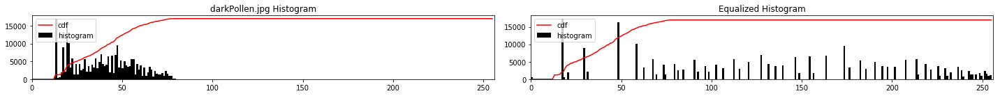

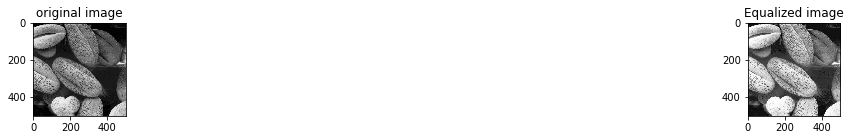

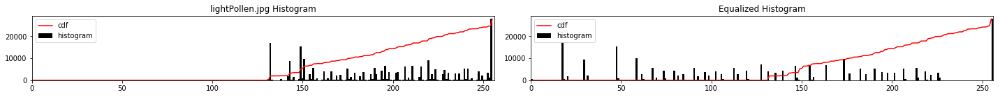

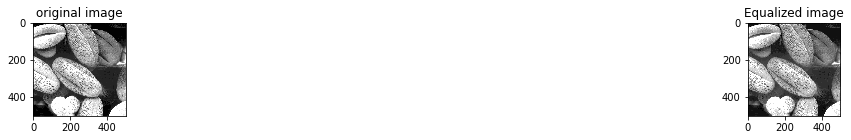

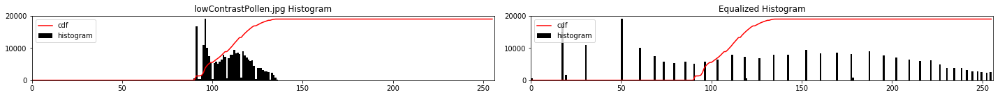

...

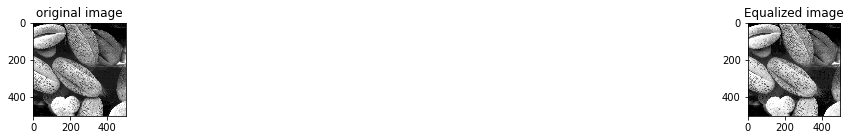

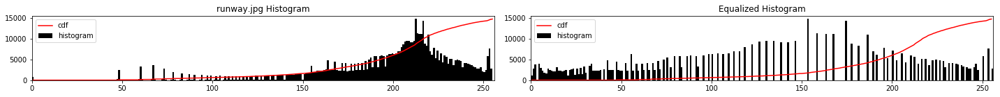

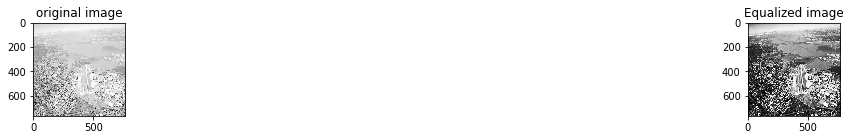

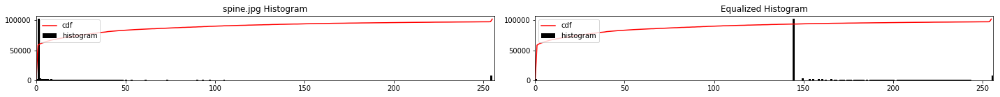

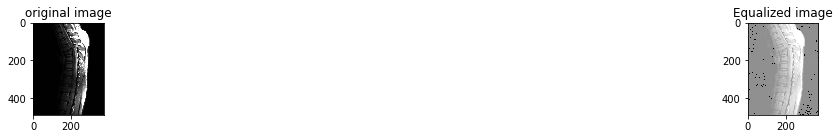

In [4]:
def ImgEqua(img):
    #To use numpy.histogram(inputvector,bins) the input vector has to have one direction img.flatten() solve that
    hist,bins=np.histogram(img.flatten(),256,[0,256])
    #getting de CDF using in the plot
    cdf=hist.cumsum()
    cdf_plot = cdf*hist.max()/cdf.max()
    #Getting equalized image
    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')
    imgeq=cdf[img]
    return [imgeq,cdf_plot]
i=1
for filename in os.listdir('images_ps/'):
    #Reading Images
    img = cv2.imread(os.path.join('images_ps/',filename),cv2.IMREAD_GRAYSCALE)
    #Plotting Images
    if filename.endswith(".jpg"):
        if img is not None:
            plt.figure(figsize=(20,20))
            imgeq,cdf=ImgEqua(img)
            plt.subplot(12,2,i)
            plt.plot(cdf, color = 'r')
            plt.hist(img.flatten(),256,[0,255], color = 'k')
            plt.xlim([0,256])
            plt.legend(('cdf','histogram'), loc = 'upper left')
            plt.title('%s Histogram' % (filename))
            i=i+1
            plt.subplot(12,2,i)
            plt.plot(cdf, color = 'r')
            plt.hist(imgeq.flatten(),256,[0,256], color = 'k')
            plt.xlim([0,256])
            plt.legend(('cdf','histogram'), loc = 'upper left')
            plt.title('Equalized Histogram')
            i=i+1
            plt.tight_layout()
            plt.figure(figsize=(20,20))
            plt.subplot(12,2,i)
            plt.imshow(img,cmap='gray')
            plt.title('original image')
            i=i+1
            plt.subplot(12,2,i)
            plt.imshow(imgeq,cmap='gray')
            plt.title('Equalized image')
            i=i+1
            plt.tight_layout()
plt.show()

Please comment results here.

#### Implementación:
Se utilizó la función <tt>np.histogram()</tt> la cual tiene como parametros de entrada un vector de una dirección y el rango de valores el número de barras (256), y el rango (desde 0 a 255). Para poder calcular el histograma de la imagen, fue necesario convertir la matrix de la imagen en un vector de una dirección usando el método <tt>.flatten()</tt>. se calcula la CDF sabiendo que es la sumatoria del histograma normalizado, por esto se usa la función hist.cumsum() y luego se normaliza para ser gráficada. La función  <tt>np.ma.masked_equal()</tt> permite realizar operaciones solo con los valores que no cumplen con la máscara, en este caso todos los valores de la cdf distintos a 0. Es necesario definir como entero sin signo la cdf, para luego realizar la transformación usando <tt>cdf[img]</tt>.
#### Resultados:
Los resultados arriba demuestran como la ecualización de histograma distribuye los valores de intensidad a lo largo del histograma. Para imágenes como <tt>darkpollen.jpg</tt>, donde la mayoría de pixeles tienen un nivel de intensidad bajo, la ecualización de histograma expande el rango de los valores de pixels y permite obtener una imagen con histograma ecualizado. También, se observo como <tt>lowContrastPollen.jpg</tt>, una imagen en donde la mayoría valores de los pixeles están en un rango medio, al ser ecualizada mejora su contraste, pues se aumenta el rango de los valores de intensidad de los pixeles. Por otro lado, se observa la gran utilidad que tiene la ecualización de histograma en imágenes médicas, como las obtenidas por rayos X. Se observó como la imagen ecualizada de <tt>spine.jpg</tt> permite apreciar más detalles, que inicialmente no se podian ver por la falta de contraste en la imagen original. 

### Problem 2

Implement the code for the function below which performs a power law transformation on an image. This function should take an image array and the gamma value to be used in the transformation as its only input parameters. The function should return a new image array which is the power transformation of the original image. Power law transformations are achieved using the following formula:
$$ g(x,y) = T[f(x,y)] = c \cdot f(x,y) ^ \gamma $$

where $g(x,y)$ is the output pixel value, $f(x,y)$ is the original pixel value, $\gamma$ is the parameter controlling the power law transformation and $c$ is a constant usually set to 1. Note that you convert the image so that the intensity values are in the range 0.0 – 1.0, rather than in 0 – 255.

Try this new function out on the images <tt>spine.jpg</tt> and <tt>runway.jpg</tt>, experimenting with different values for $\gamma$. Please comment your results.

#### Solución:

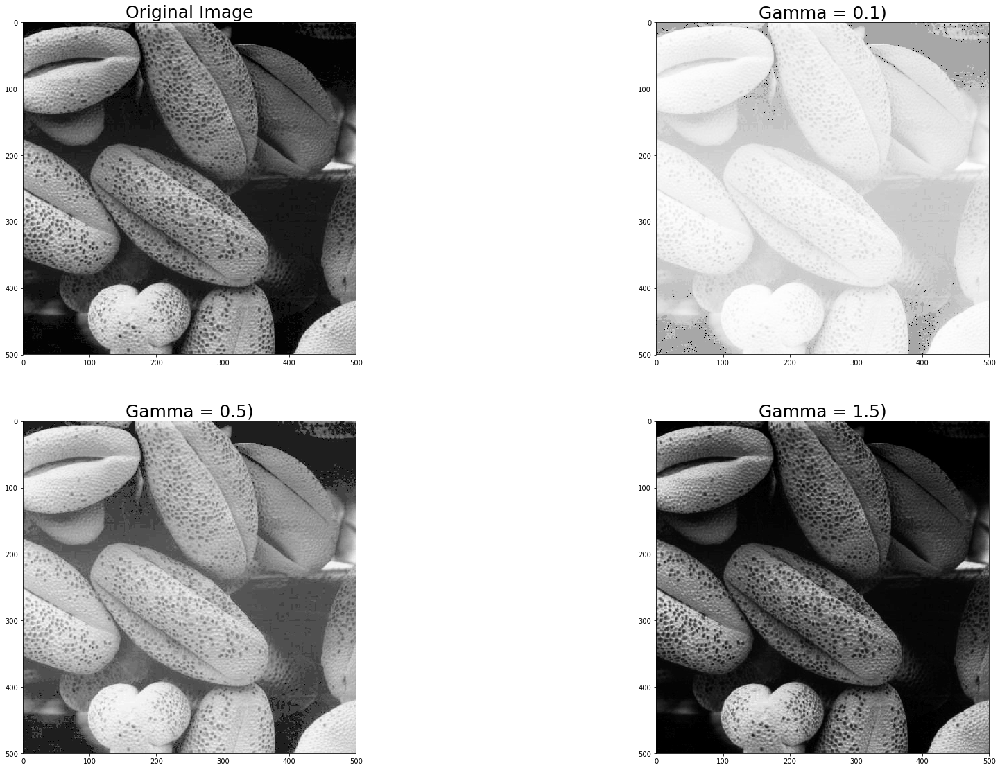

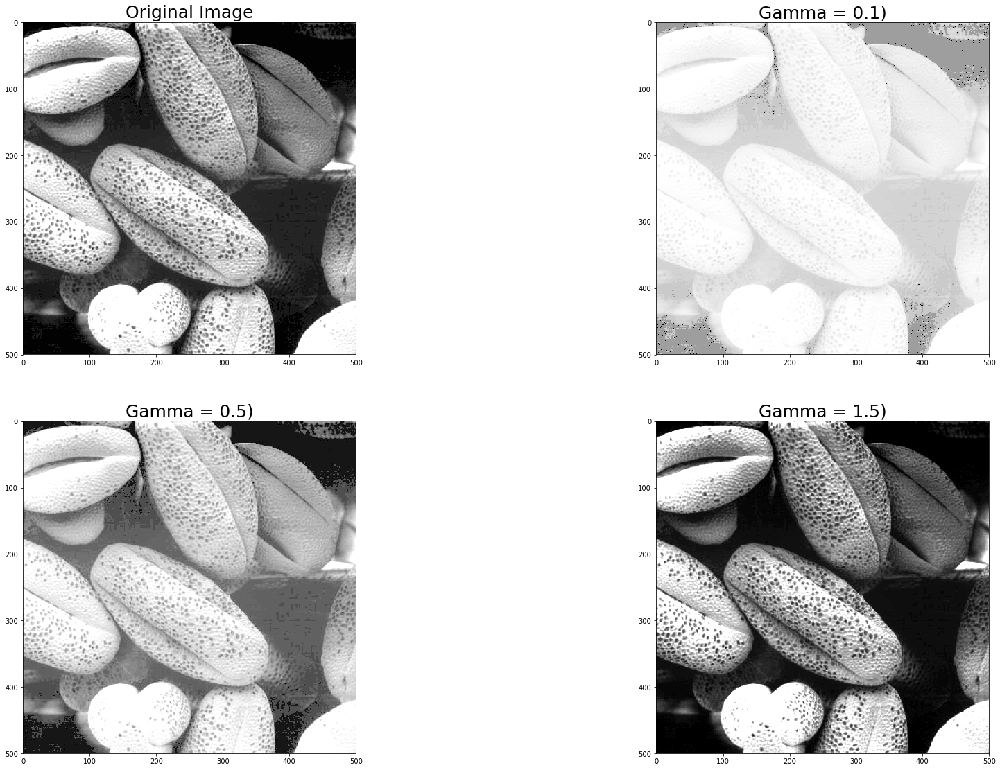

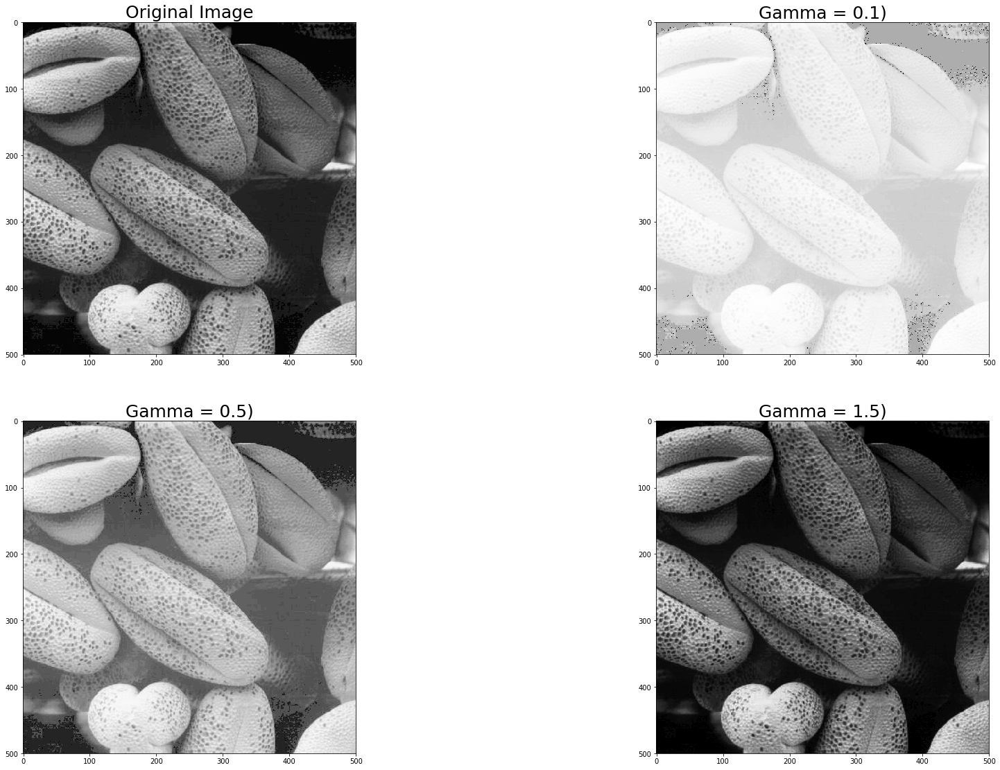

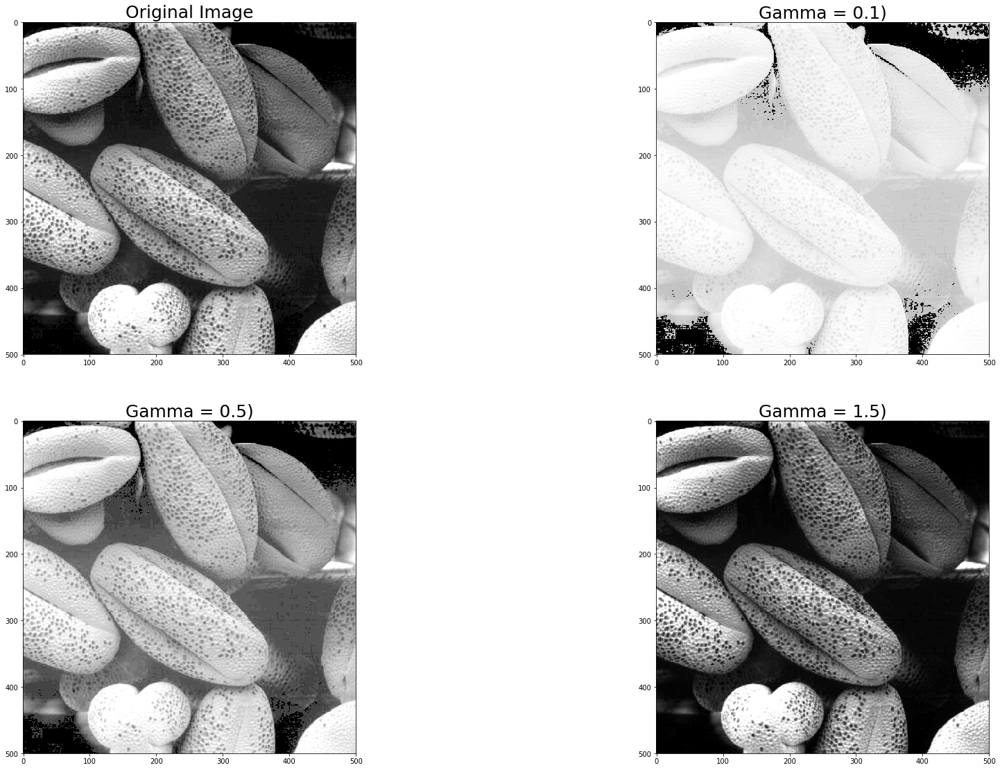

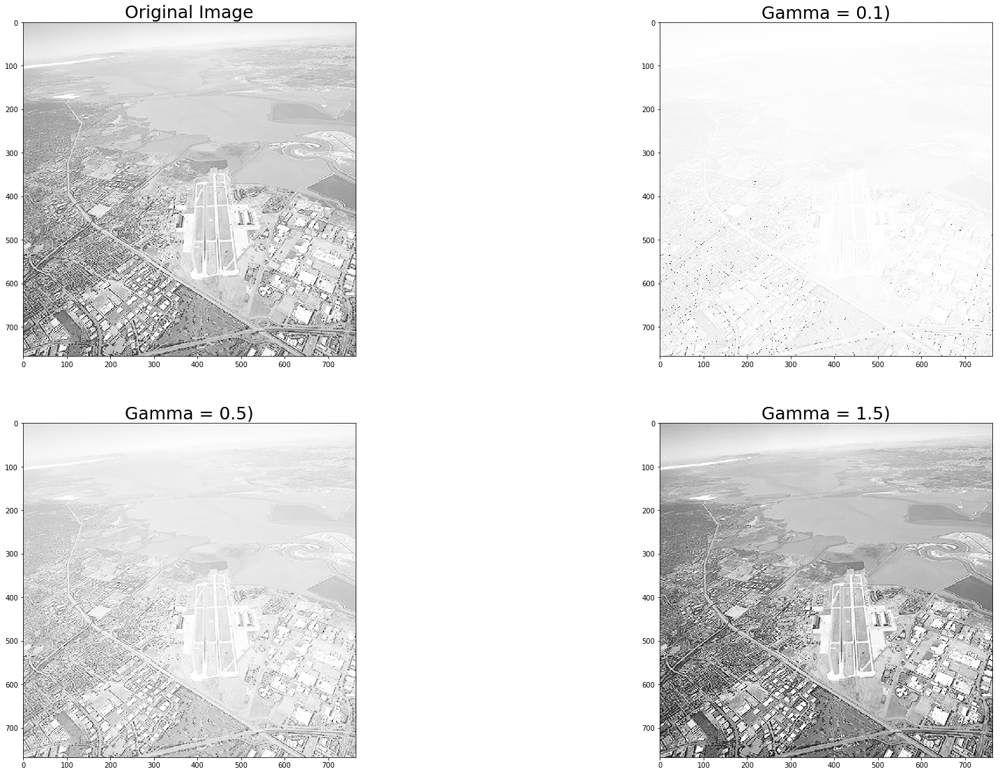

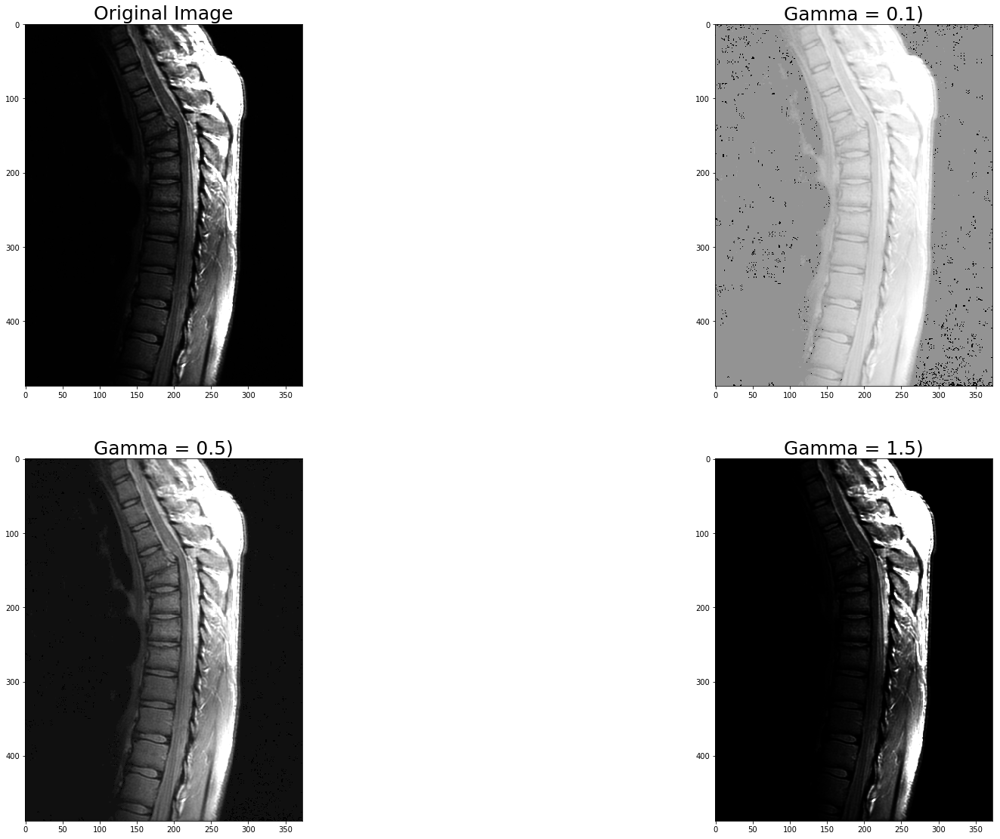

In [13]:
#Define function
def powerlaw(img, gamma):
    normalized_img = np.zeros(img.shape)
    power_img = np.zeros(img.shape)
    normalized_img = cv2.normalize(img,normalized_img, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F) #Normalizing the image to values in range 0 to 1
    for i in range(0, np.size(normalized_img,0)):
        for j in range(0, np.size(normalized_img,1)): 
            power_img[i,j] = normalized_img[i,j]**gamma #Gamma transformation, c equals to 1
    return power_img

#Define function called for each image
def behaviour(image):
    range_g=[0.1,0.5,1.5] #Different gamma values
    plt.figure(figsize=(30,30))
    plt.subplot(3,2,1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image', fontsize=25)

    i=2
    for gamma in range_g: #For loop that changes gamma value
        power_img = powerlaw(image, gamma) #Calling the function
        plt.subplot(3,2,i); plt.imshow(power_img, cmap='gray'); 
        plt.title('Gamma = '+str(gamma)+')', fontsize=25)
        i=i+1
    plt.show()


for filename in os.listdir('images_ps/'):
    #Reading Images
    img = cv2.imread(os.path.join('images_ps/',filename),cv2.IMREAD_GRAYSCALE)
    #Plotting Images
    if filename.endswith(".jpg"):
        if img is not None:
            behaviour(img)



(Discuss your results after looking at the resulting images)

#### Implementación:
Para realizar el problema se utilizaron dos funciones. En la función powerlaw() se realizó la transformación de las imágenes, mientras que en función behaviour() la acción a ejecutar para cada imagen. 

En lo referente a la función powerlaw, esta recibe como parámetros: la imagen y el valor de gamma, el cual está determinado por un vector de elementos de prueba. Cabe destacar que para poder realizar la transformación, la imagen debe estar normalizada. Esto se logra con la función normalize de OpenCV. Teniendo la imagen normalizada y el valor de gamma, se procede a hacer la transformación para cada pixel y devolver la imagen transformada.  

Con respecto a la función behaviour, ésta solo contiene como parámetros de entrada la imagen para obtener de la función powerlaw la imagen transformada y realizar las gráficas correspondientes.

#### Resultados:
Luego de observar las imágenes transformadas y comparándolas con las originales, se puede concluir que entre más alto sea el valor de gamma, más oscura será la transformación de la imagen. Con valores menores a 1, la imagen será más clara, mientras que con valores mayores que 1, la imagen se vuelve más oscura. No se tomó como objeto de prueba el valor de gamma=1, teniendo en cuenta que para este valor, no se realiza ninguna transformación en la imágen, sino que es lineal. Estos resultados provienen del hecho que gamma está elevado al cuadrado en la ecuación.

### Problem 3

Implement a function that performs smoothing on an input image with an averaging filter mask of size $n$. The function should take two inputs: an image matrix and the filter size $n$. Use the image <tt>test_pattern_blurring_orig.tif</tt> to test your algorithm. Use averaging filter masks of sizes $n = 3, 5, 9, 15, 35$. Analyze the results you obtained.

### Solución:

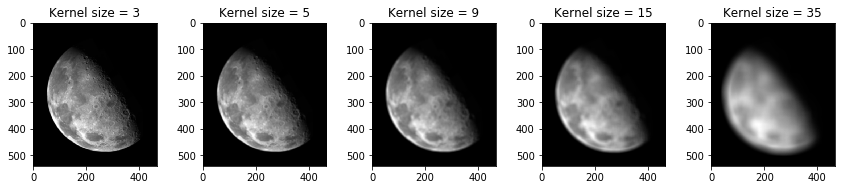

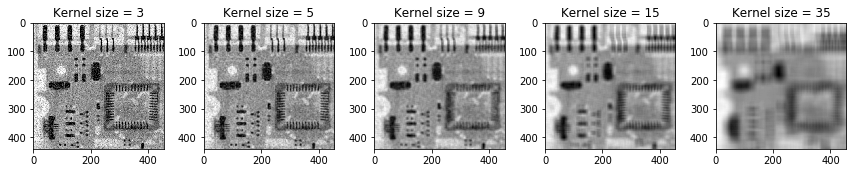

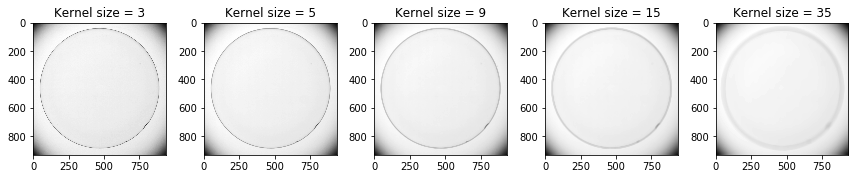

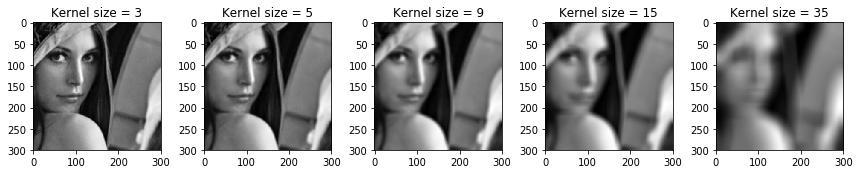

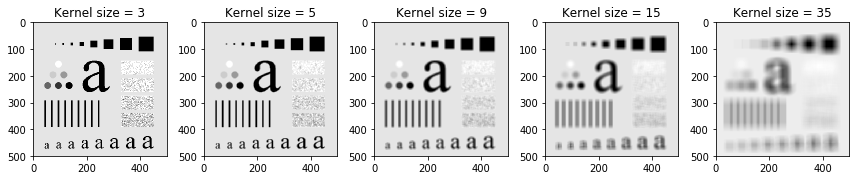

In [15]:
def smooth_image(img_input,kernel_size):
    #Create kernel
    kernel=np.ones((kernel_size,kernel_size))/(kernel_size)**2
    img_filter=cv2.filter2D(img_input,cv2.CV_8U,kernel)
    return img_filter
#plotting images
index=1
for filename in os.listdir('images_ps/'): 
    #Reading Images
    img = cv2.imread(os.path.join('images_ps/',filename),cv2.IMREAD_GRAYSCALE)  
    img_filter=np.zeros(img.shape)

    #Plotting Images
    if filename.endswith(".png"):
        if img is not None:
            plt.figure(figsize=(12,12))
            plt.subplot(5,5,index)
            img_filter=smooth_image(img,3)
            plt.imshow(img_filter,cmap='gray')
            plt.title('Kernel size = 3')
            plt.subplot(5,5,index+1)
            img_filter=smooth_image(img,5)
            plt.imshow(img_filter,cmap='gray')
            plt.title('Kernel size = 5')
            plt.subplot(5,5,index+2)
            img_filter=smooth_image(img,9)
            plt.imshow(img_filter,cmap='gray')
            plt.title('Kernel size = 9')
            plt.subplot(5,5,index+3)
            img_filter=smooth_image(img,15)
            plt.imshow(img_filter,cmap='gray')
            plt.title('Kernel size = 15')
            plt.subplot(5,5,index+4)
            img_filter=smooth_image(img,35)
            plt.imshow(img_filter,cmap='gray')
            plt.title('Kernel size = 35')
            index=index+5
            plt.tight_layout()
plt.show()


#### Implementación:
Se utilza función cv2.filter2D() que realiza el filtrado de la imagen con kernels de diferentes tamaños, de tal forma que se pueda realizar el filtro de media. 
#### Resultados:
Se observa como al aumentar el tamaño del kernel se ve más borrosa la imagen de entrada. En el caso de la imagen <tt>ckt_board_saltpep_prob_pt05.png</tt> se aprecia como a medida que aumenta el kernel el ruido sal y pimienta disminuye. 

### Problem 4

Consider the image <tt>ckt_board_saltpep_prob_pt05.png</tt>. It has been corrupted with ‘salt-and-pepper’ noise (more formally known as impulse noise). Try to remove the noise from this image by applying a median filter of size 3x3. Compare the result to applying an averaging filter of size 3x3.  Increase the kernel size to 3x3, 5x5, 9x9, 15x15 and repeat. Analyze the results you obtained. Did the filter successfully remove the noise? Did you observe any other side effects?

You can also corrupt any image you like with a salt-and-pepper noise generator. Write another function which adds salt-and-pepper noise to an input image. Use that function to corrupt additional images. Try to recover the original images using a median filter of appropriate size.

### Solución:

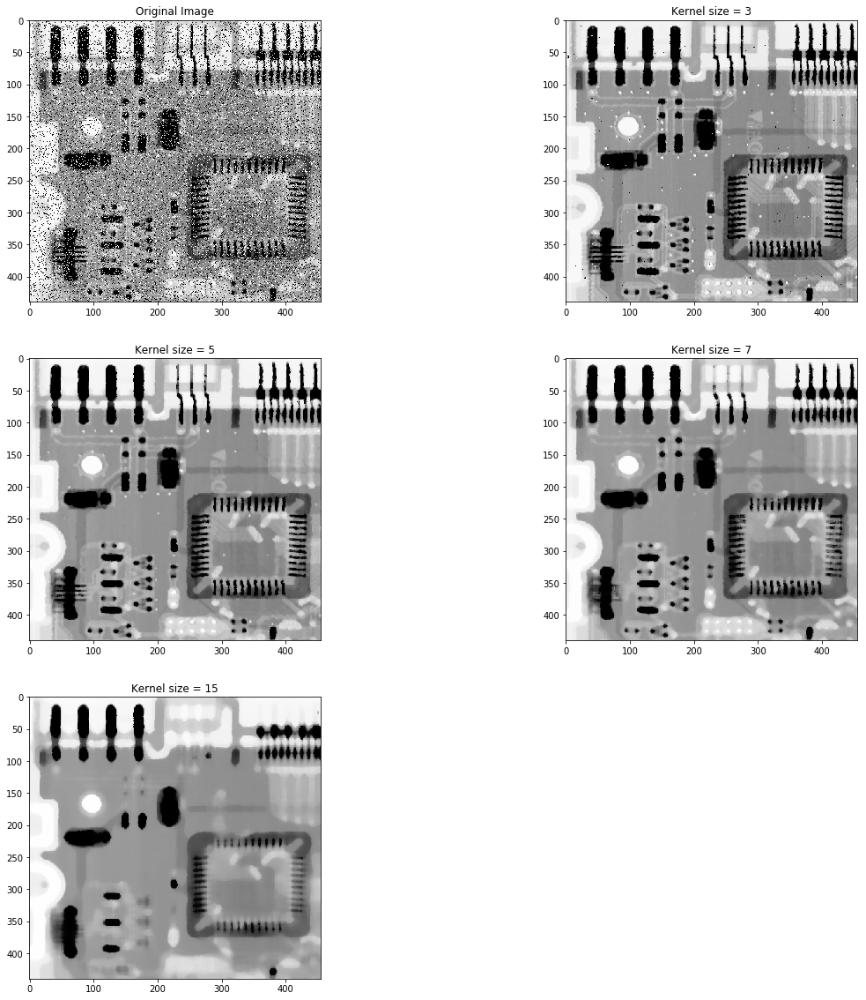

In [52]:
#Removing ckt_board_saltpep_prob_pt05.png7
def medianfilter(image,kernel_size):
    img_filter = cv2.medianBlur(image,kernel_size) #Applying averaging filter
    return img_filter

img = cv2.imread('images_ps/ckt_board_saltpep_prob_pt05.png',cv2.IMREAD_GRAYSCALE)  
plt.figure(figsize=(20,20))
plt.subplot(3,2,1)
plt.imshow(img,cmap='gray')
plt.title('Original Image')

img_filter=medianfilter(img,3)
plt.subplot(3,2,2)
plt.imshow(img_filter,cmap='gray')
plt.title('Kernel size = 3')

img_filter=medianfilter(img,5)
plt.subplot(3,2,3)
plt.imshow(img_filter,cmap='gray')
plt.title('Kernel size = 5')

img_filter=medianfilter(img,7)
plt.subplot(3,2,4)
plt.imshow(img_filter,cmap='gray')
plt.title('Kernel size = 7')

img_filter=medianfilter(img,9)
plt.subplot(3,2,5)
plt.imshow(img_filter,cmap='gray')
plt.title('Kernel size = 9')

img_filter=medianfilter(img,15)
plt.subplot(3,2,5)
plt.imshow(img_filter,cmap='gray')
plt.title('Kernel size = 15')


#### Implementación:
Se utilza función cv2.medianBlur() que realiza el filtro de mediana de la imagen. Esta funcion tiene como parámetros la imagen y tamaño del kernel a utilizar. 
#### Resultados:
Es notorio que el filtro de mediana disminuye la distorsión por sal y pimienta desde el kernel de tamaño 3. Sin embargo, se observa como al aumentar el tamaño del kernel se van perdiendo detalles en la imagen. 

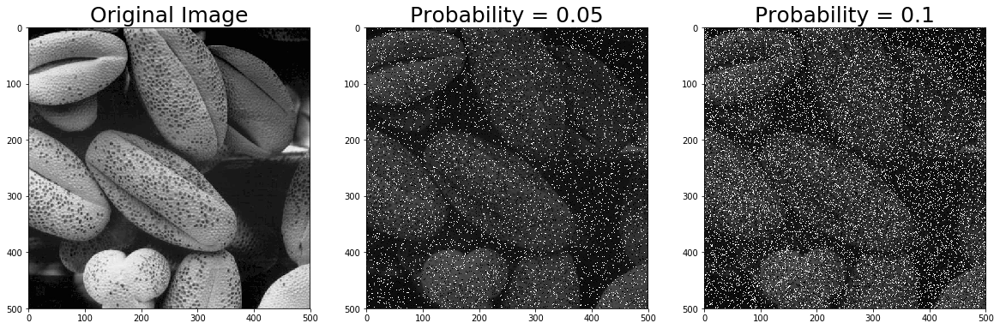

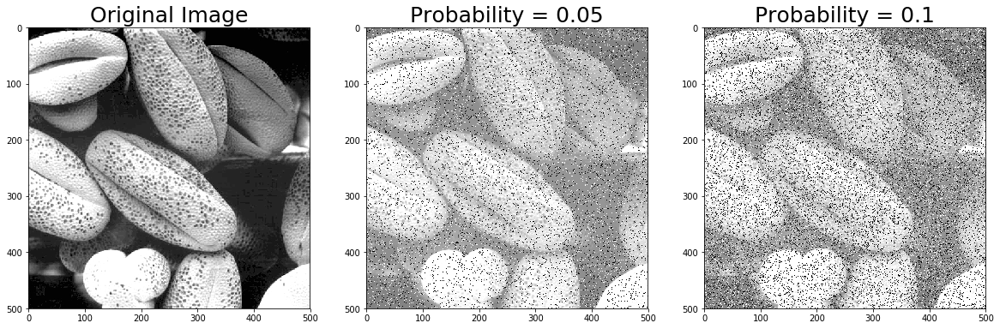

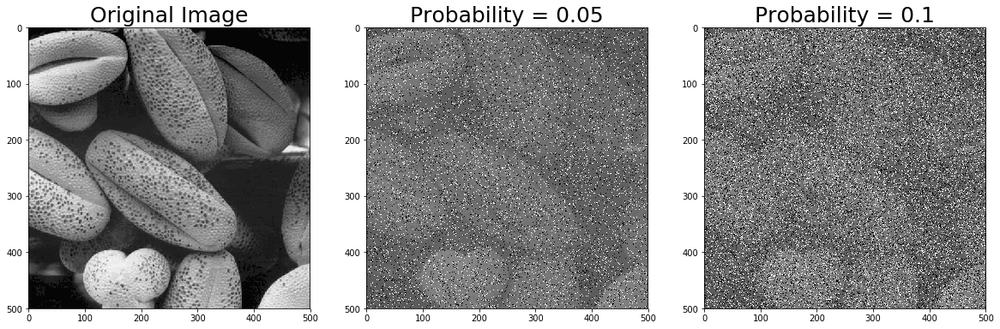

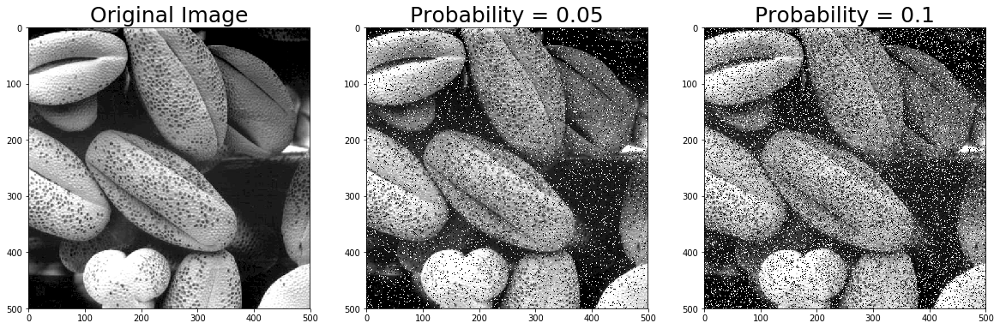

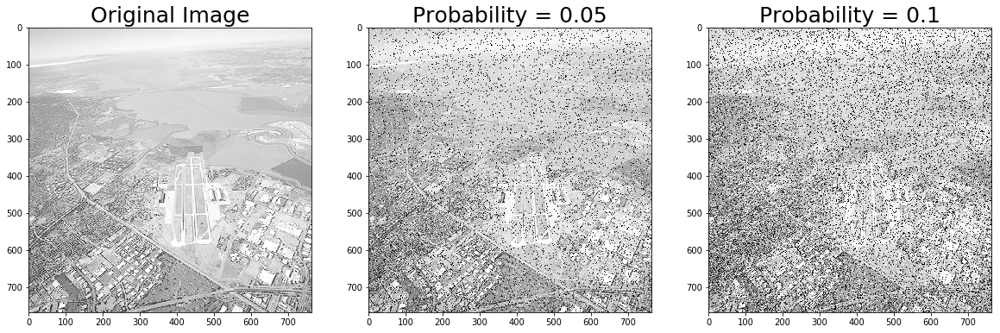

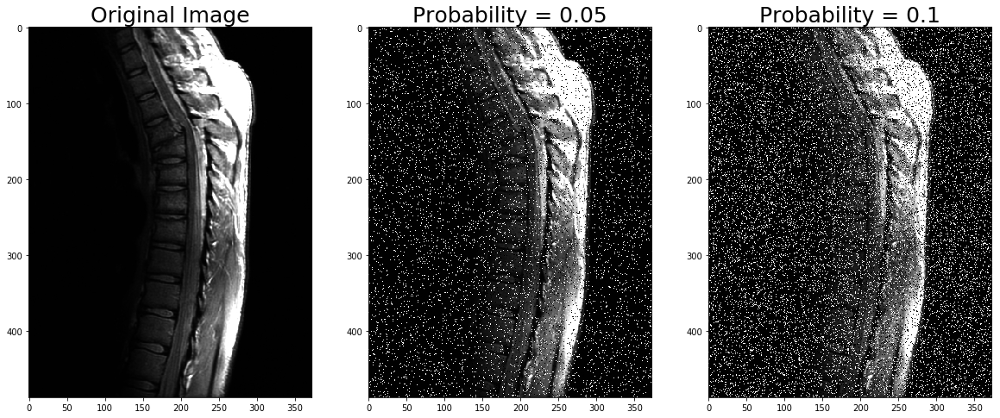

In [3]:
#Adding salt and pepper noise
def saltpepper(image,prob_s, prob_p):
    corr_image = np.zeros(image.shape) #Matrix of zeros with size of the input image
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random() #Random float number ranging from 0 to 1
            if rdn < prob_p:  
                corr_image[i][j] = 0 #If the random number is less than the input percentage, give the pixel a 0 value
            elif rdn > (1-prob_s):
                corr_image[i][j] = 255 #If the random number is higher than the input percentage, give the pixel a 255 value
            else:
                corr_image[i][j] = image[i][j] #If the random number is between both percentages, give the pixel the same value
    return corr_image

def behaviour_corr(img):
    range_p=[0.05,0.1]
    plt.figure(figsize=(20,20))
    plt.subplot(1,3,1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image', fontsize=25)
    m=2
    for i in range_p:
        #Adding salt and pepper noise
        corr = saltpepper(img,i,i)
        plt.subplot(1,3,m); plt.imshow(corr, cmap='gray'); 
        plt.title('Probability = '+str(i), fontsize=25)
        m+=1         

    plt.show()
for filename in os.listdir('images_ps/'):
    #Reading Images
    img = cv2.imread(os.path.join('images_ps/',filename),cv2.IMREAD_GRAYSCALE)
    #Plotting Images
    if filename.endswith(".jpg"):
        if img is not None:
            behaviour_corr(img)

(Discuss your results after looking at the resulting images) Analyze the results you obtained. Did the filter successfully remove the noise? Did you observe any other side effects?

#### Implementación:
Se definen las funciones saltpepper y behaviour_corr. En saltpepper se tiene como parámetros de entrada la imagen original y los porcentajes de sal y pimienta. Se construye una matriz de ceros para agregar los nuevos valores. Con la función random, se obtiene un valor entre 0 y 1, para cada pixel. Si ese valor es mayor a la proporcion de sal, se sustituye el pixel con 255, por el contrario, si ese valor es menor a la proporción de pimienta, se sustituye con 0. En caso de estar entre la proporción de saly la de pimienta, se mantiene igual el valor del pixel. En la función de comportamiento se añade ruido a cada una de las funciones. 
#### Resultados:
Es notorio que entre más grande sea la proporción de sal y de pimienta, mayor ruido se agregará a la imagen, perdiendo más detalles. Utilizando la función definida anteriormente se puede eliminar el ruido que se les fue agregado.

### Problem 5 

`1. Write a function that sharpens an image using the Laplacian kernel. Your function should first compute the Laplacian of the input image using the following kernel:
<table>
<tr>
<td>0</td>
<td>1</td>
<td>0</td>
</tr>
<tr>
<td>1</td>
<td>-4</td>
<td>1</td>
</tr>
<tr>
<td>0</td>
<td>1</td>
<td>0</td>
</tr>
</table>

2. Visualize the Laplacian of the input image. You may consider using a power intensity transformation to enhance the Laplacian image for visualization.

3. Recall that sharpening is achieved by subtraction: $g(x,y) = f(x,y) - \nabla^2 f(x,y) $. Use this method to produce an enhanced image.

4. Recall that subtraction and filtering with a kernel are linear operations. Therefore, it is possible to combine both operations into a single kernel:
<table>
<tr>
<td>0</td>
<td>-1</td>
<td>0</td>
</tr>
<tr>
<td>-1</td>
<td> 5</td>
<td>-1</td>
</tr>
<tr>
<td>0</td>
<td>-1</td>
<td>0</td>
</tr>
</table>
Write another function that directly sharpens the image using this single kernel.

5. Finally, recall that there is an alternative kernel that can be used to compute a Laplacian: 
<table>
<tr>
<td>1</td>
<td>1</td>
<td>1</td>
</tr>
<tr>
<td>1</td>
<td> -8</td>
<td>1</td>
</tr>
<tr>
<td>1</td>
<td>1</td>
<td>1</td>
</tr>
</table>
Write another function that produces a sharpened image using a single enhancement kernel that is based on this alternative definition of the Laplacian.


Apply all the functions you wrote to the image <tt>blurry_moon.png</tt>. Compare, analyze and comment all the results. You are also encouraged to try out your functions on more testing images.

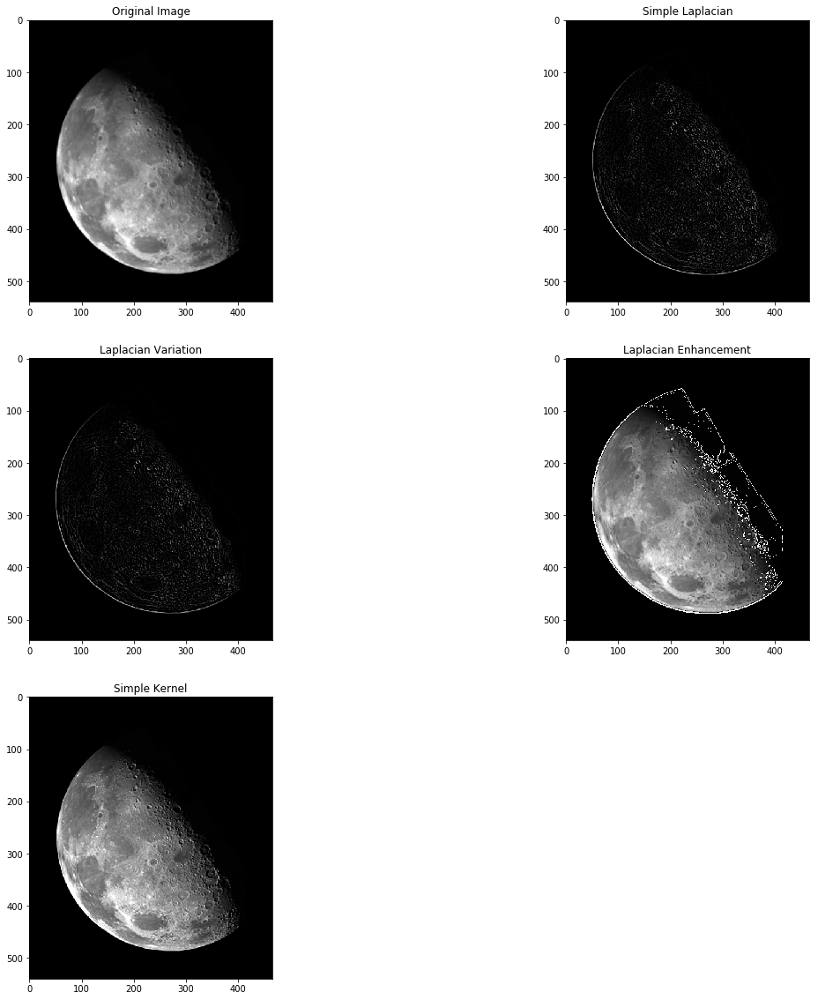

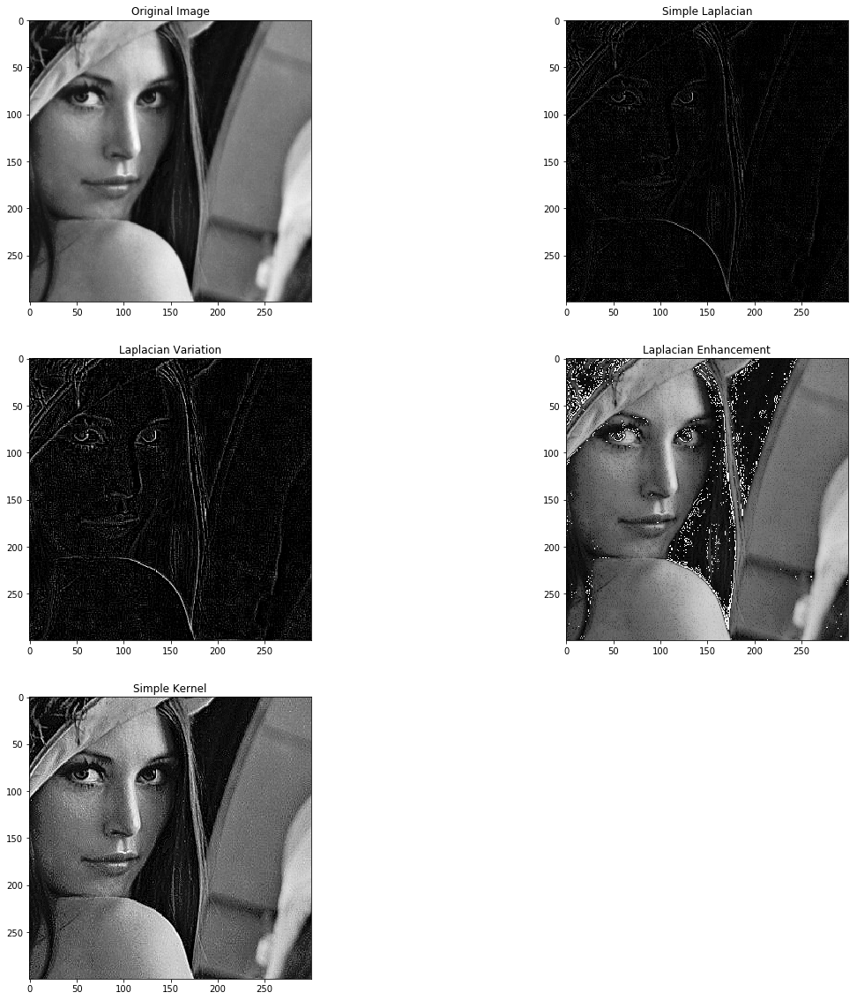

In [23]:
#1. 
def SimpleLaplacian(imageA): #Function to apply the substraction kernel
    simple_kernel=np.array([[0,1,0],[1,-4,1],[0,1,0]],dtype=np.float32) #Build the substraction kernel
    img_f = cv2.filter2D(imageA,-1,simple_kernel)  #Apply the kernel
    return img_f   #Return the result

def LaplacianVariation(imageA):
    variant_kernel = np.array([[1,1,1],[1,-8,1],[1,1,1]]) #Build the Variant Laplacian kernel
    img_f2 = cv2.filter2D(imageA,-1,variant_kernel)  #Apply the kernel
    return img_f2   #Return the result
#2.
def LaplacianEnhancement(imageA, image_l):
    img_enh = imageA - image_l
    return img_enh   #Return the result

#2.
def SimpleKernel(imageA):
    simple_kernel=np.array([[0,-1,0],[-1,5,-1],[0,-1,0]]) #Build the substraction kernel
    img_simple = cv2.filter2D(imageA,-1,simple_kernel)  #Apply the kernel
    return img_simple   #Return the result
    
def behaviourLaplacian(imageA):
    img_l = SimpleLaplacian(imageA)
    img_le = LaplacianVariation(imageA)
    img_enhancement = LaplacianEnhancement(imageA,img_l)
    img_simpleK = SimpleKernel(imageA)

    plt.figure(figsize=(20,20))
    plt.subplot(3,2,1)
    plt.imshow(imageA, cmap='gray')
    plt.title('Original Image')
    plt.subplot(3,2,2)
    plt.imshow(img_l, cmap='gray')
    plt.title('Simple Laplacian')
    plt.subplot(3,2,3)
    plt.imshow(img_le, cmap='gray')
    plt.title('Laplacian Variation')
    plt.subplot(3,2,4)
    plt.imshow(img_enhancement, cmap='gray')
    plt.title('Laplacian Enhancement')
    plt.subplot(3,2,5)
    plt.imshow(img_simpleK, cmap='gray')
    plt.title('Simple Kernel')
    plt.show()

    
imageA = cv2.imread ('images_ps/blurry_moon.png',cv2.IMREAD_GRAYSCALE) #Read original image
behaviourLaplacian(imageA)

imageB = cv2.imread ('images_ps/face.png',cv2.IMREAD_GRAYSCALE) #Read original image
behaviourLaplacian(imageB)


#### Implementación:
Se definen 5 funciones en este problema, 4 referente a los requerimientos y una que contiene el comportamiento de la función. En cada una de las funciones de los requerimientos se aplican los kernel específicos a la imagen, utilizando la función cv2.filter2D(). 
#### Resultados:
Es notorio que utilizando el kernel básico, se pierden detalles en la imagen, mientras que con el kernel que realiza la operación deseada, se obtienen los resultados esperados, resaltando los detalles en la imagen.

Compare, analyze and comment all the results. You are also encouraged to try out your functions on more testing images.


## Problem 6

The gradient of an image is the two-dimensional vector

$\nabla \mathbf{f} = \left[ \begin{array}{c}G_x\\G_y\end{array} \right] 
=\left[ \begin{array}{c}\frac{\partial f}{\partial x}\\ \frac{\partial f}{\partial y} \end{array} \right]
$

1. Write a function that calculates the image gradients in the $x$ and $y$ directions. Use the following Sobel operators to compute the derivatives:
<table>
<tr>
<td>-1</td>
<td>-2</td>
<td>-1</td>
</tr>
<tr>
<td>0</td>
<td>0</td>
<td>0</td>
</tr>
<tr>
<td>1</td>
<td>2</td>
<td>1</td>
</tr>
</table>
<table>
<tr>
<td>-1</td>
<td>0</td>
<td>1</td>
</tr>
<tr>
<td>-2</td>
<td>0</td>
<td>2</td>
</tr>
<tr>
<td>-1</td>
<td>0</td>
<td>1</td>
</tr>
</table>
The function should output two variables, $G_x$ and $G_y$, which correspond to the derivatives in the $x$ and $y$ directions. Visualize the resulting gradients. Analyze the results obtained. How can you interpret the gradient operators?

2. Write another function that computes the gradient magnitude of an image. Recall that the magnitude of the gradient vector can be computed by:<br>
$\nabla f = \text{mag}(\nabla \mathbf{f}) = \left[ G_x^2 + G_y^2 \right]^\frac{1}{2}$.

3. Write another function that computes an approximation of the gradient magnitude using the following equation: <br>
$\nabla f \approx |G_x| + |G_y|$. <br>
Visualize and compare the resulting gradient magnitudes computed using both methods. How can you interpret the gradient magnitude?

You may use the images <tt>contact_lens_original.png</tt> and <tt>face.png<tt> to test your algorithms.


Solución

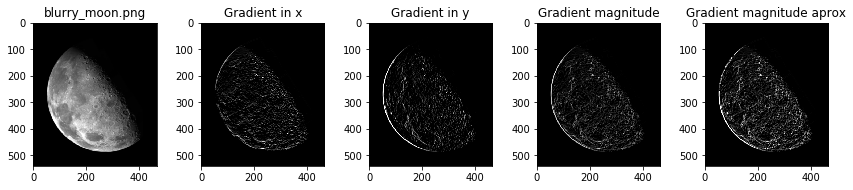

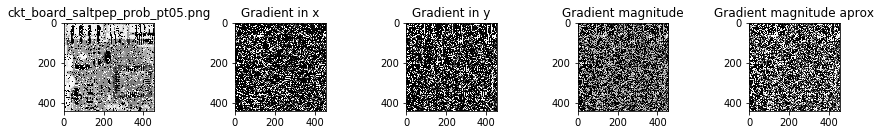

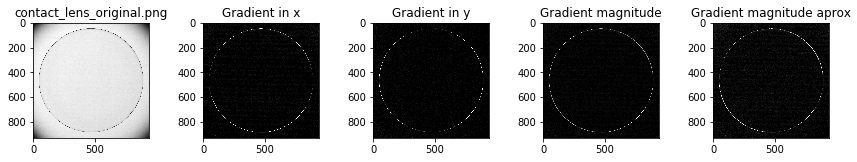

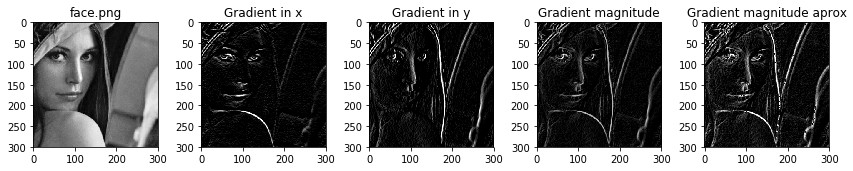

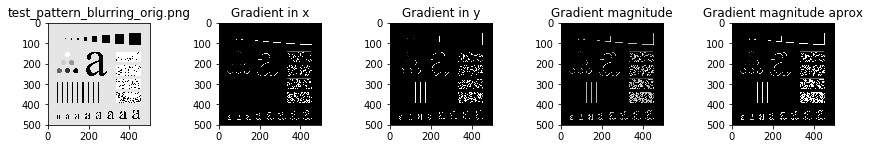

In [61]:
#1. Function Gradxy that returns imGx and imGy
def Gradxy(img):
    #Sobel Kernels for Gx and Gy
    Sobelx=np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
    Sobely=Sobelx.transpose()
    #Using filter function to get image gradients in x and y 
    #cv2.filter2D(input,format,kernel)
    imGx=cv2.filter2D(img,cv2.CV_8U,Sobelx)
    imGy=cv2.filter2D(img,cv2.CV_8U,Sobely)
    return [imGx,imGy]
#2. Function Gradmag, that compute gradient magnitude 
def Gradmag(img):
    imGx,imGy = Gradxy(img)
    #Computing gradient magnitude it is neccesary to normalize the image divide for the max value
    Grad=((imGx/np.amax(imGx))**2+(imGy/np.amax(imGy))**2)**0.5
    return Grad
#3. function GradAprox, that computes an approximation of the gradient magnitude
def GradAprox(img):
    imGx,imGy=Gradxy(img)
    #approximation of the gradient magnitude
    GradApx=np.absolute(imGx)+np.absolute(imGy)
    return GradApx
#get image
img=cv2.imread('images_ps/',cv2.IMREAD_GRAYSCALE)    
index=1
for filename in os.listdir('images_ps/'): 
    #Reading Images
    img = cv2.imread(os.path.join('images_ps/',filename),cv2.IMREAD_GRAYSCALE)  
    #Plotting Images
    if filename.endswith(".png"):
        if img is not None:
            #using functions 
            imGx,imGy=Gradxy(img)
            Grad=Gradmag(img)
            GradAprx=GradAprox(img)
            #ploting results
            plt.figure(figsize=(12,12))
            plt.subplot(5,5,index)
            plt.imshow(img,cmap='gray')
            plt.title(filename)
            plt.subplot(5,5,index+1)
            plt.imshow(imGx,cmap='gray')
            plt.title('Gradient in x')
            plt.subplot(5,5,index+2)
            plt.imshow(imGy,cmap='gray')
            plt.title('Gradient in y')
            plt.subplot(5,5,index+3)
            plt.imshow(Grad,cmap='gray')
            plt.title('Gradient magnitude')
            plt.subplot(5,5,index+4)
            plt.imshow(GradAprx,cmap='gray')
            plt.title('Gradient magnitude aprox')
            index=index+5
            plt.tight_layout()
plt.show()
    

(Discuss your results after looking at the resulting images) Analyze the results you obtained.How can you interpret the gradient operators? How can you interpret the gradient magnitude?

#### Implementación:
La función <tt>Gradxy</tt> usa los kernel de Sobel proporcionados para obtener el gradiente en x y en y, utilizando la función cv2.filter2D. 
La función <tt>Gradmag</tt> calcula la magnitud del gradiente de la imagen de entrada, para esto es necesario normalizar antes las matrices. La normalización se realiza dividiendo los gradientes en x y en y entre su valor máximo.
La función <tt>GradAprox</tt> calcula el gradiente aproximado de la imagen de entrada. 
#### Resultados: 
Se observa como los gradientes en x de las imagenes de prueba muestrar los cambios en el eje x de la imagen, así mismo ocurre para los gradientes en y, en donde se observa los cambios en el eje y. Además, al obtener la magnitud del gradiente se observa con detalle los bordes de la imagen. la magnitud aproximada del gradiente es muy parecida a la magnitud del gradiente. 
Teniendo en cuenta lo anterior, se observa que los gradientes se interpetran como los bordes, en x o en y. A mayor cambió más alto será el valor del gradiente, por tanto en los bordes con altos cambios de intensidad, se observan valores más altos de gradiente. Además, la magnitud del gradiente se puede interpretar como los bordes en toda la imagen, tanto en x y en y. 